In [83]:
# for loading/processing the images
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [84]:
path = "/home/user/Desktop/ML/flower_images/flower_images"
os.chdir(path)

In [85]:
flowers = []

with os.scandir(path) as files:
    for file in files:
        if file.name.endswith('.png'):
            flowers.append(file.name)

# print(flowers)

In [86]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

In [87]:
def extract_features(file, model):
    file = "/home/user/Desktop/ML/flower_images/flower_images/" + file
    img = load_img(file, target_size = (224, 224))
    img = np.array(img)
    reshaped_img = img.reshape(1, 224, 224, 3)
    imgx = preprocess_input(reshaped_img)
    features = model.predict(imgx)

    return features

In [88]:
data = {}
p = r"flower_features.pk1"

for flower in flowers:
    feat = extract_features(flower, model)
    data[flower] = feat

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [44]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1, 4096)

In [45]:
# get the unique labels (from the flower_labels.csv)
df = pd.read_csv('/home/user/Desktop/ML/flower_images/flower_images/flower_labels.csv')
true_labels = df['label'].tolist()
unique_labels = list(set(true_labels))

In [54]:
# reduce the amount of dimensions in the feature vector
pca = PCA(n_components = 100, random_state = 22)
x = pca.fit_transform(feat)

In [56]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Create a logistic regression estimator
estimator = LogisticRegression(max_iter = 1000)

# Select the top 100 features using RFE
selector = RFE(estimator, n_features_to_select = 100)
selector = selector.fit(x, true_labels)  # Use true labels to guide selection

# Get the selected features
selected_features = selector.transform(x)

# Cluster using the selected features
kmeans = KMeans(n_clusters = len(unique_labels), random_state = 22)
kmeans.fit(selected_features)

%%
&&&


KMeans(n_clusters=10, random_state=22)

In [57]:
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [58]:
def view_cluster(cluster):
    plt.figure(figsize = (25, 25));
    files = groups[cluster]
    if len(files) > 30:
        print("Clipping cluster size from", {len(files)}, "to 30")
        files = files[:29]

    for index, file in enumerate(files):
        file = "/home/user/Desktop/ML/flower_images/flower_images/" + file

        plt.subplot(10, 10, index + 1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

Clipping cluster size from {58} to 30
Clipping cluster size from {35} to 30


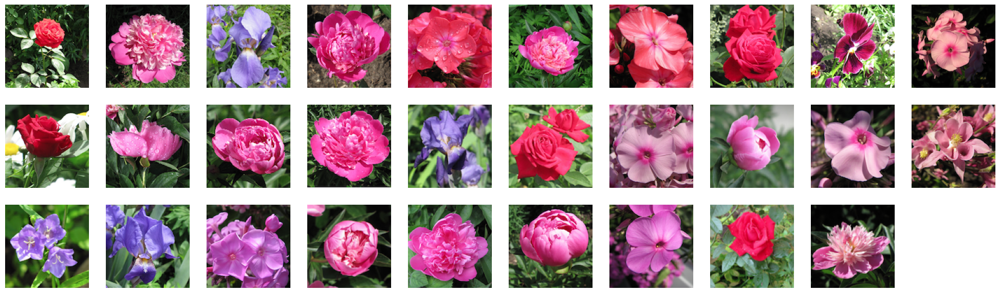

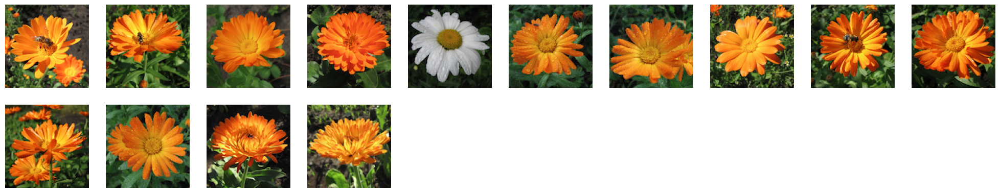

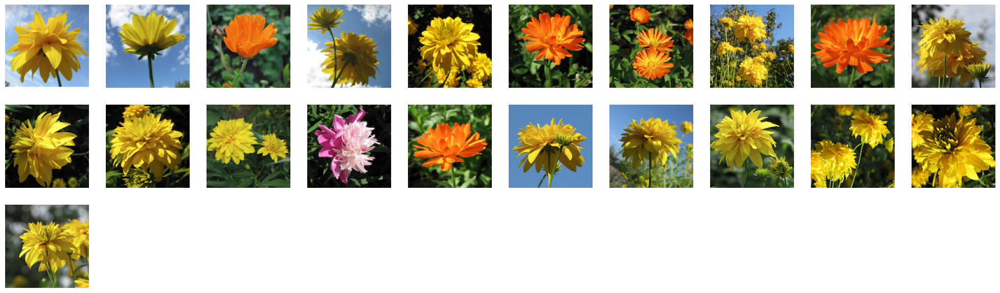

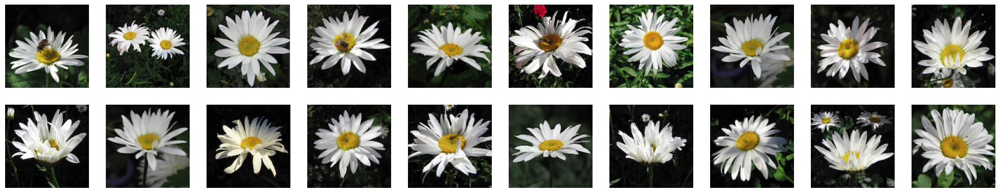

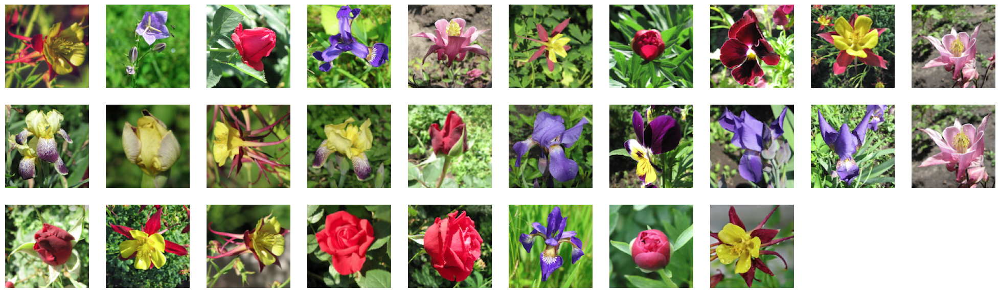

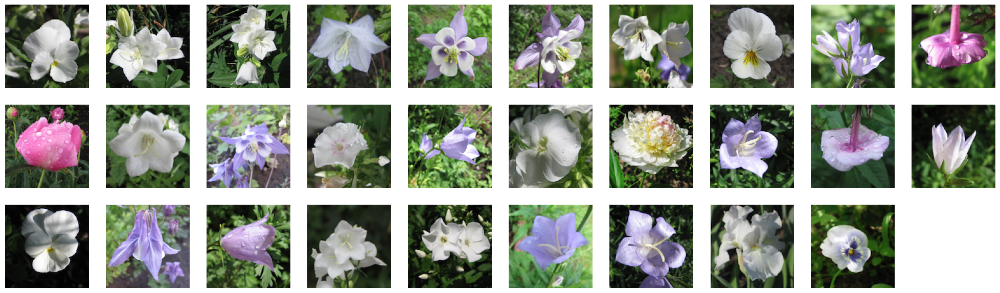

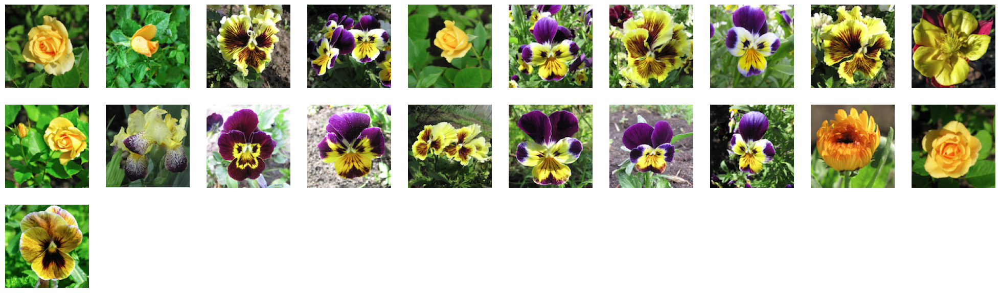

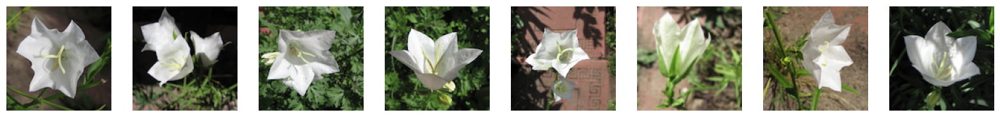

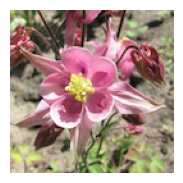

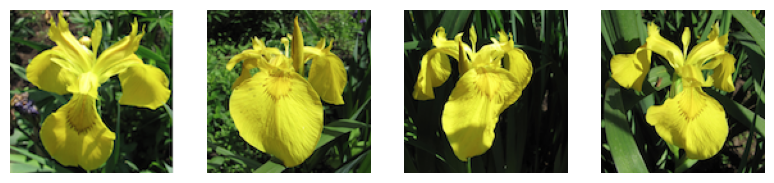

In [59]:
for cluster_id in groups:
    view_cluster(cluster_id)

plt.show()

Adjusted Rand Index (ARI): -0.00040332099557724936


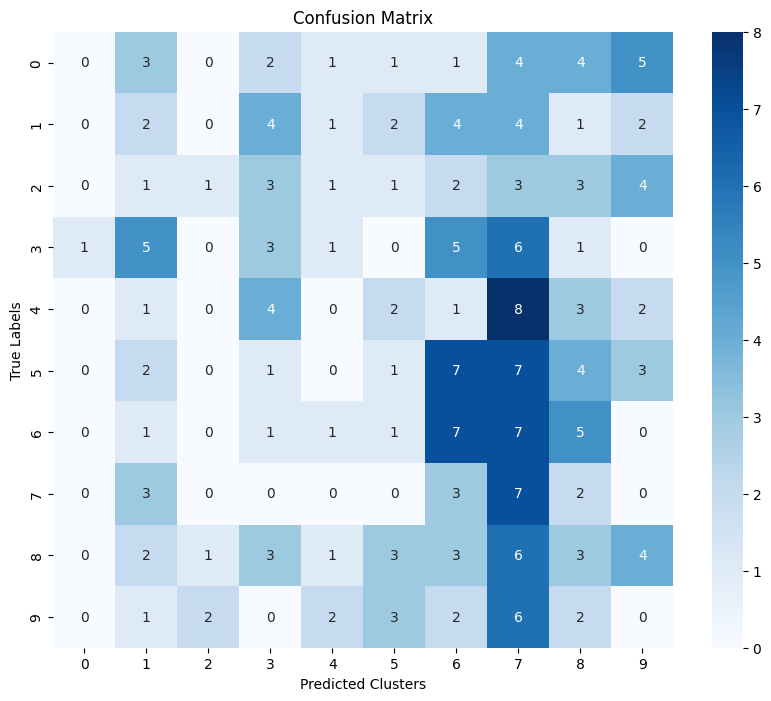

In [68]:
from sklearn.metrics import adjusted_rand_score, confusion_matrix
import seaborn as sns  # For better confusion matrix visualization

# 1. Get True Labels in the Same Format
true_labels = df['label'].tolist()  # List of true labels from your CSV

# 2. Calculate Adjusted Rand Index (ARI)
ari = adjusted_rand_score(true_labels, kmeans.labels_)
print(f"Adjusted Rand Index (ARI): {ari}")

# 3. Build and Visualize Confusion Matrix
conf_matrix = confusion_matrix(true_labels, kmeans.labels_)

# Optionally map cluster IDs to labels for better interpretation
cluster_label_mapping = {i: unique_labels[i] for i in range(len(unique_labels))} 
conf_matrix_labeled = pd.DataFrame(conf_matrix, index=unique_labels, columns=unique_labels)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_labeled, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Clusters")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


In [77]:
# Load the labels from the CSV file
true_labels = df['label'].tolist()

# Associate each filename with its corresponding label
filename_to_label = dict(zip(filenames, true_labels))

filename_to_label

{'0042.png': 0,
 '0061.png': 0,
 '0136.png': 2,
 '0146.png': 0,
 '0123.png': 0,
 '0167.png': 1,
 '0055.png': 6,
 '0169.png': 0,
 '0200.png': 0,
 '0191.png': 0,
 '0204.png': 0,
 '0074.png': 0,
 '0059.png': 0,
 '0060.png': 7,
 '0008.png': 7,
 '0202.png': 1,
 '0140.png': 0,
 '0148.png': 0,
 '0036.png': 6,
 '0179.png': 0,
 '0091.png': 2,
 '0047.png': 4,
 '0033.png': 7,
 '0005.png': 4,
 '0201.png': 5,
 '0041.png': 6,
 '0210.png': 2,
 '0193.png': 5,
 '0037.png': 6,
 '0067.png': 6,
 '0018.png': 3,
 '0093.png': 6,
 '0006.png': 5,
 '0085.png': 0,
 '0199.png': 3,
 '0141.png': 8,
 '0125.png': 5,
 '0071.png': 9,
 '0208.png': 2,
 '0194.png': 8,
 '0079.png': 9,
 '0198.png': 1,
 '0032.png': 7,
 '0114.png': 3,
 '0102.png': 1,
 '0205.png': 4,
 '0187.png': 7,
 '0117.png': 3,
 '0176.png': 8,
 '0052.png': 1,
 '0164.png': 3,
 '0139.png': 4,
 '0159.png': 7,
 '0021.png': 9,
 '0115.png': 3,
 '0027.png': 6,
 '0170.png': 5,
 '0024.png': 8,
 '0019.png': 6,
 '0126.png': 8,
 '0112.png': 2,
 '0088.png': 1,
 '0056.p

In [76]:
# Determine the most frequent label for each cluster
cluster_to_label = {}
for cluster_id, files in groups.items():
    labels_in_cluster = [filename_to_label[file] for file in files]
    most_common_label = max(set(labels_in_cluster), key = labels_in_cluster.count)
    cluster_to_label[cluster_id] = most_common_label

cluster_to_label

{7: 4, 5: 8, 3: 1, 9: 0, 8: 6, 6: 5, 1: 3, 4: 9, 0: 3, 2: 9}

In [81]:
# Assign predicted labels based on cluster_to_label mapping
predicted_labels = [cluster_to_label[cluster] for cluster in kmeans.labels_]

In [82]:
# Calculate accuracy
correct = sum(1 for true, pred in zip(true_labels, predicted_labels) if true == pred)
total = len(true_labels)
accuracy = (correct / total) * 100

print(f"Number of correctly clustered images: {correct}")
print(f"Total number of images: {total}")
print(f"Clustering accuracy: {accuracy:.2f}%")

Number of correctly clustered images: 42
Total number of images: 210
Clustering accuracy: 20.00%
